In [1]:
from random import random
import time
from dataclasses import dataclass
from typing import List, Any, Optional, Mapping
from enum import Enum
import math
import statistics
import matplotlib.animation
import matplotlib.pyplot as plt

In [2]:
@dataclass
class Vector:
    x: float
    y: float

    @property
    def norm(self) -> float:
        return math.sqrt(self.x * self.x + self.y * self.y)

    def __mul__(self, factor: float) -> "Vector":
        return Vector(x=self.x * factor, y=self.y * factor)

    def __truediv__(self, divisor: float) -> "Vector":
        return Vector(x=self.x / divisor, y=self.y / divisor)
        
    def __add__(self, other: "Vector") -> "Vector":
        return Vector(x=self.x + other.x, y=self.y + other.y)

    def __sub__(self, other: "Vector") -> "Vector":
        return Vector(x=self.x - other.x, y=self.y - other.y)

    def clamp(self, min_value: "Vector", max_value: "Vector") -> None:
        self.x = min(max_value.x, max(min_value.x, self.x))
        self.y = min(max_value.y, max(min_value.y, self.y))

@dataclass
class Food:
    mass: float
    position: Vector
    velocity: Vector
    force: Vector

class PheromoneType(Enum):
    FOOD = 1
    HOME = 2

In [3]:
class Ant:
    position: Vector
    map: Any
    linear_velocity: Vector
    angular_velocity_amplitude: float
    angular_velocity_period: float
    prev_time: float
    touching_food: Optional[Food] = None
    home_pheromone_amount: float
    position_history: List[Vector]
    ignore_food_pheromone_ticks: int
    
    MAX_SPEED_DIM_METERS: float = 0.01  # [m/s]
    MIN_SPEED_DIM_METERS: float = 0.005  # [m/s]
    PHEROMONE_INCREASE_PER_ANT: float = 0.1  # []
    FOOD_RADIUS: float = 0.025  # [m]
    FORCE_ON_FOOD: float = 0.0001  # [N]
    MAX_POS_HISTORY_LENGTH: int = 20  # [m]
    
    def __init__(self, map: Any, position: Vector):
        self.home_pheromone_amount = 1
        self.map = map
        self.position = position
        self.linear_velocity = Vector((2 * random() - 1) * self.MAX_SPEED_DIM_METERS, (2 * random() - 1) * self.MAX_SPEED_DIM_METERS)
        if abs(self.linear_velocity.x) < self.MIN_SPEED_DIM_METERS:
            self.linear_velocity.x = math.copysign(self.MIN_SPEED_DIM_METERS, self.linear_velocity.x)
        if abs(self.linear_velocity.y) < self.MIN_SPEED_DIM_METERS:
            self.linear_velocity.y = math.copysign(self.MIN_SPEED_DIM_METERS, self.linear_velocity.y)
        self.angular_velocity_amplitude = math.pi / 10 + random() * math.pi / 20
        self.angular_velocity_period = random() * 0.01
        self.prev_time = None
        self.position_history = []
        self.ignore_food_pheromone_ticks = 0
        
        # Init sensing environment cells.
        self.sensed_cells = []
        for j in range(4):
            for i in range(4):
                self.sensed_cells.append(Vector(-j-1, -i-1))
            self.sensed_cells.append(Vector(-j-1, 0))
            for i in range(4):
                self.sensed_cells.append(Vector(-j-1, i+1))
        for i in range(4):
            self.sensed_cells.append(Vector(0, -i-1))
        for i in range(4):
            self.sensed_cells.append(Vector(0, i+1))
        for j in range(4):
            for i in range(4):
                self.sensed_cells.append(Vector(j+1, -i-1))
            self.sensed_cells.append(Vector(j+1, 0))
            for i in range(4):
                self.sensed_cells.append(Vector(j+1, i+1))

    def move(self, new_pos):
        self.position = new_pos
        if self.position.x < 0:
            self.position.x = 0
            self.linear_velocity.x = -self.linear_velocity.x
        if self.position.y < 0:
            self.position.y = 0
            self.linear_velocity.y = -self.linear_velocity.y
            
        if self.position.x >= self.map.width - self.MAX_SPEED_DIM_METERS:
            self.position.x = self.map.width - self.MAX_SPEED_DIM_METERS
            self.linear_velocity.x = -self.linear_velocity.x
        if self.position.y >= self.map.height - self.MAX_SPEED_DIM_METERS:
            self.position.y = self.map.height - self.MAX_SPEED_DIM_METERS
            self.linear_velocity.y = -self.linear_velocity.y

        # Update position history.
        self.position_history.append(self.position)
        if len(self.position_history) > self.MAX_POS_HISTORY_LENGTH:
            self.position_history.pop(0)
            
            # If too long at the same position, stop reacting to food pheromones for a bit.
            stdev_x = statistics.stdev([p.x for p in self.position_history])
            stdev_y = statistics.stdev([p.y for p in self.position_history])
            if stdev_x < 0.01 and stdev_y < 0.01:
                self.ignore_food_pheromone_ticks = 50
    
    def pheromone_comparer(self, cell, c, max_i, max_j, pheromone_type):
        cell_j = cell.j + c.y
        cell_i = cell.i + c.x
        # Cells outside of the world
        if cell_j < 0 or cell_j >= len(self.map.cells):
            return -1
        if cell_i < 0 or cell_i >= len(self.map.cells[0]):
            return -1
        return map.cells[cell_j][cell_i].pheromone[pheromone_type] if pheromone_type in map.cells[cell_j][cell_i].pheromone else 0
    
    def food_comparer(self, cell, c, max_i, max_j):
        cell_j = cell.j + c.y
        cell_i = cell.i + c.x
        if cell_j < 0 or cell_j >= len(self.map.cells):
            return -1
        if cell_i < 0 or cell_i >= len(self.map.cells[0]):
            return -1
        return 1 if map.cells[cell_j][cell_i].has_food else 0
    
    def update(self, map, time: float):
        time_inc = time - self.prev_time if self.prev_time is not None else 0
        self.prev_time = time
        
        cell = map.cell_at(self.position)

        if self.touching_food is not None:
            # Pull the food in the direction of most home pheromone intensity.
            next_cell = max(self.sensed_cells, key=lambda c: self.pheromone_comparer(cell, c, len(map.cells[0]), len(map.cells), PheromoneType.HOME))
            if PheromoneType.HOME in map.cells[cell.j + next_cell.y][cell.i + next_cell.x].pheromone:
                distance = next_cell.norm
                if distance > 0:
                    direction = next_cell / distance
                    self.touching_food.force = self.touching_food.force + direction * self.FORCE_ON_FOOD
            return

        # Smell food in surroundings.
        next_cell = max(self.sensed_cells, key=lambda c: self.food_comparer(cell, c, len(map.cells[0]), len(map.cells)))
        if map.cells[cell.j + next_cell.y][cell.i + next_cell.x].has_food:
            # Smelled food: produce food pheromone.
            map.cells[cell.j][cell.i].pheromone[PheromoneType.FOOD] = 1.0
            # Move towards the food in a straight line, up to a minimum distance.
            distance_cells = math.sqrt(next_cell.x * next_cell.x + next_cell.y * next_cell.y)
            distance = distance_cells * self.map.PHEROMONE_MAP_RESOLUTION_METERS
            if distance > self.FOOD_RADIUS:
                factor = min(self.MAX_SPEED_DIM_METERS, distance - self.FOOD_RADIUS)
                direction = Vector(next_cell.x / distance_cells, next_cell.y / distance_cells)
                speed = Vector(direction.x * factor, direction.y * factor)
                self.move(Vector(self.position.x + speed.x, self.position.y + speed.y))
            else:
                self.touching_food = map.cells[cell.j + next_cell.y][cell.i + next_cell.x].food
        else:
            # Smell food pheromones in surroundings.
            next_cell = max(self.sensed_cells, key=lambda c: self.pheromone_comparer(cell, c, len(map.cells[0]), len(map.cells), PheromoneType.FOOD))
            if self.ignore_food_pheromone_ticks == 0 and PheromoneType.FOOD in map.cells[cell.j + next_cell.y][cell.i + next_cell.x].pheromone:
                if PheromoneType.FOOD in map.cells[cell.j][cell.i].pheromone:
                    map.cells[cell.j][cell.i].pheromone[PheromoneType.FOOD] += map.cells[cell.j + next_cell.y][cell.i + next_cell.x].pheromone[PheromoneType.FOOD] * 0.1
                else:            
                    map.cells[cell.j][cell.i].pheromone[PheromoneType.FOOD] = map.cells[cell.j + next_cell.y][cell.i + next_cell.x].pheromone[PheromoneType.FOOD] * 0.1
                factor = self.MAX_SPEED_DIM_METERS / math.sqrt(next_cell.x * next_cell.x + next_cell.y * next_cell.y)
                speed = Vector(next_cell.x * factor, next_cell.y * factor)
                self.move(Vector(self.position.x + speed.x, self.position.y + speed.y))
            else:
                if self.ignore_food_pheromone_ticks > 0:
                    self.ignore_food_pheromone_ticks -= 1
                    
                # Release home pheromone.
                if PheromoneType.HOME in map.cells[cell.j][cell.i].pheromone:
                    map.cells[cell.j][cell.i].pheromone[PheromoneType.HOME] += self.home_pheromone_amount
                else:
                    map.cells[cell.j][cell.i].pheromone[PheromoneType.HOME] = self.home_pheromone_amount
                self.home_pheromone_amount *= 0.9
                                
                self.move(Vector(self.position.x + self.linear_velocity.x * time_inc, self.position.y + self.linear_velocity.y * time_inc))
                angular_velocity = self.angular_velocity_amplitude * math.sin(2 * math.pi * time / self.angular_velocity_period)
                self.linear_velocity = Vector(self.linear_velocity.x * math.cos(angular_velocity) + self.linear_velocity.y * math.sin(angular_velocity), -self.linear_velocity.x * math.sin(angular_velocity) + self.linear_velocity.y * math.cos(angular_velocity))


In [4]:
@dataclass
class MapCell:
    i: int
    j: int
    pheromone: Mapping[PheromoneType, float]
    food: Optional[Food]

    @property
    def has_food(self) -> bool:
        return self.food is not None

class Map:
    width: float
    height: float
    ants: List[Ant]
    cells: List[List[MapCell]]
    time: float
    anthill_position: Vector
    food_positions: List[Vector]

    PHEROMONE_MAP_RESOLUTION_METERS: float = 0.01
    FOOD_STATIC_FRICTION_COEFF: float = 0.3
    FOOD_DYNAMIC_FRICTION_COEFF: float = 0.1
    FOOD_MAX_VELOCITY: float = 0.01
    G: float = 9.81
    
    def __init__(self, width: float, height: float, anthill_position: Vector, num_ants: int):
        self.time = 0
        self.width = width
        self.height = height
        self.anthill_position = anthill_position
        self.food_positions = []
        self.ants = []
        for i in range(num_ants):
            self.ants.append(Ant(map=self, position=anthill_position))
        self._figure = None
        self.cells = []
        for y in range(int(height / self.PHEROMONE_MAP_RESOLUTION_METERS)):
            self.cells.append([])
            for x in range(int(width / self.PHEROMONE_MAP_RESOLUTION_METERS)):
                self.cells[-1].append(MapCell(i=x, j=y, pheromone={}, food=None))

    def put_food(self, food: Food) -> None:
        self.food_positions.append(food.position)
        self.cell_at(food.position).food = food

    def plot(self) -> None:
        plt.cla()
        ax = plt.gca()
        ax.set_aspect('equal', 'box')
        ax.set_autoscale_on(False)
        ax.set_xlim([0, 1])
        ax.set_ylim([0, 1])
        plt.plot([p.x + self.PHEROMONE_MAP_RESOLUTION_METERS / 2 for p in self.food_positions], [p.y + self.PHEROMONE_MAP_RESOLUTION_METERS / 2 for p in self.food_positions], 'go')
        plt.plot([self.anthill_position.x], [self.anthill_position.y], 'ro')
        # for row in self.cells:
        #     plt.plot([c.i * self.PHEROMONE_MAP_RESOLUTION_METERS for c in row if PheromoneType.FOOD in c.pheromone], [c.j * self.PHEROMONE_MAP_RESOLUTION_METERS for c in row if PheromoneType.FOOD in c.pheromone], 'r.')
        #     plt.plot([c.i * self.PHEROMONE_MAP_RESOLUTION_METERS for c in row if PheromoneType.HOME in c.pheromone and c.pheromone[PheromoneType.HOME] > 0.1], [c.j * self.PHEROMONE_MAP_RESOLUTION_METERS for c in row if PheromoneType.HOME in c.pheromone and c.pheromone[PheromoneType.HOME] > 0.1], 'c.')
        plt.plot([a.position.x for a in self.ants], [a.position.y for a in self.ants], 'b.')    
        
        for p in self.food_positions:
            cell = self.cell_at(p)
            plt.plot([p.x, p.x + 10 * cell.food.force.x], [p.y, p.y + 10 * cell.food.force.y], 'y-')
    
    def update(self) -> None:
        # Restart all force on food.
        for p in self.food_positions:
            self.cell_at(p).food.force = Vector(0, 0)
            
        # Update ants.    
        for ant in self.ants:
            ant.update(self, self.time)
            
        # Update position of food based on force model.
        dropped_food_indices = []
        for i in range(0, len(self.food_positions)):
            p = self.food_positions[i]
            cell = self.cell_at(p)
            food = cell.food
            friction_coeff = self.FOOD_STATIC_FRICTION_COEFF
            if food.velocity.norm > 1e-3:
                friction_coeff = self.FOOD_DYNAMIC_FRICTION_COEFF
                
            force_norm = food.force.norm
            if force_norm > 0:
                direction = food.force / force_norm
                friction_force_norm = friction_coeff * food.mass * self.G
                if friction_force_norm < food.force.norm:
                    total_force = food.force - direction * friction_force_norm
                    acceleration = total_force / food.mass
                    food.velocity = food.velocity + acceleration                     
                
            vel_norm = food.velocity.norm
            if vel_norm > 0:
                food.velocity = food.velocity / vel_norm
                vel_norm = min(vel_norm, self.FOOD_MAX_VELOCITY)
                food.velocity = food.velocity * vel_norm
                food.position = food.position + food.velocity
                food.position.clamp(Vector(0, 0), Vector(self.width - self.PHEROMONE_MAP_RESOLUTION_METERS, self.height - self.PHEROMONE_MAP_RESOLUTION_METERS))                                
    
                # Move ants in touch with the food in solidarity.
                touching_ants = [a for a in self.ants if a.touching_food == food]
                for ant in touching_ants:
                    ant.position = ant.position + food.velocity
                    ant.position.clamp(Vector(0, 0), Vector(self.width - self.PHEROMONE_MAP_RESOLUTION_METERS, self.height - self.PHEROMONE_MAP_RESOLUTION_METERS))
                
                # Update cells based on new food position.
                new_cell = self.cell_at(food.position)
                if cell.i != new_cell.i or cell.j != new_cell.j:
                    # Food has moved to a new cell.
                    new_cell.food = cell.food
                    cell.food = None
                    
                self.food_positions[i] = food.position

                # If in the anthill, drop food.
                if (self.food_positions[i] - self.anthill_position).norm < 0.03:
                    dropped_food_indices.append(i)

        for i in dropped_food_indices:
            p = self.food_positions[i]
            cell = self.cell_at(p)
            touching_ants = [a for a in self.ants if a.touching_food == food]
            for ant in touching_ants:
                ant.touching_food = None
            cell.food = None
            self.food_positions.pop(i)
            
        self.plot()
        self.time += 1

    def cell_at(self, position: Vector) -> MapCell:
        return self.cells[int(position.y / self.PHEROMONE_MAP_RESOLUTION_METERS)][int(position.x / self.PHEROMONE_MAP_RESOLUTION_METERS)]

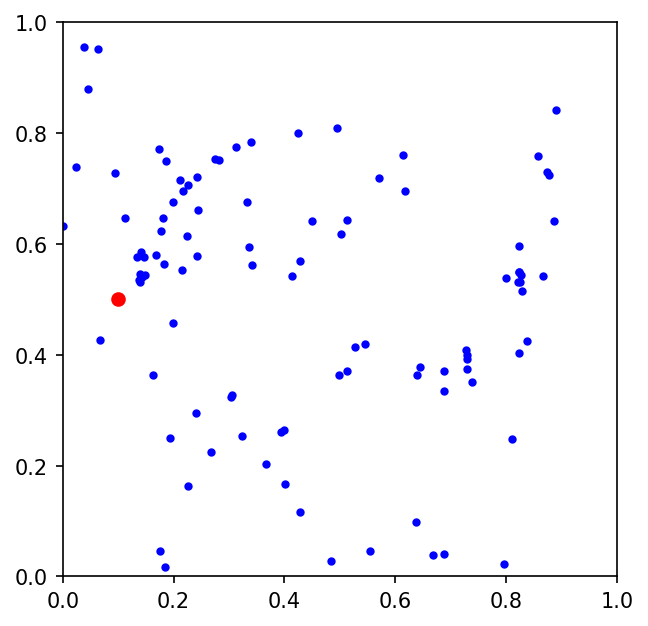

In [5]:
map = Map(width=1, height=1, anthill_position=Vector(0.1, 0.5), num_ants=100)
map.put_food(Food(position=Vector(0.8, 0.5), mass=0.0003, velocity=Vector(0, 0), force=Vector(0, 0)))
map.put_food(Food(position=Vector(0.4, 0.25), mass=0.0003, velocity=Vector(0, 0), force=Vector(0, 0)))
map.put_food(Food(position=Vector(0.2, 0.8), mass=0.0003, velocity=Vector(0, 0), force=Vector(0, 0)))

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots()
matplotlib.animation.FuncAnimation(fig, lambda t: map.update(), frames=600)